<div style="background-color:#be97c5; color:black; font-size:15px; font-family:Verdana; padding:10px;font-weight:bold;border: 5px solid black;">
<p style="color:brown;font-weight:bold"><u>Réalisé par:</u></p>
<ul >
    <li>ELGHAZI Soufiane</li>
</ul>
    
</div>

<h1 style='color:#4c4893' align='center'>Projet Computer Vision: Détection et Gestion des Risques Agricoles </h1>

<div style="background-color:white; color:black; font-size:15px; font-family:Verdana; padding:10px; border: 5px solid black;font-weight:bold;">
Notre projet ambitieux repose sur l'application de technologies de pointe en vision par ordinateur pour résoudre des défis critiques dans le domaine de l'agriculture. Dans ce Notebook , on va montrer d'une manière documenté et organisé sous format d'un rapport les différents détaills pour construire le modèle de module de herbicide contre les mauvaises herbes .
  </div>

<h2 style='color:purple' align='center'>Module 3 : Herbicide Contre les Mauvaises Herbes  </h2>

<h2 style='color:orangered' align='center'>Introduction </h2>

<div style="text-align:center;height:70;">
    <img src="https://www.thespruce.com/thmb/6OgbdDaSkPOqOFjtI-F2MHOsTrU=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/green-weed-killers-2152938-03-af1b757756934c0fb168b07594cc09f8.jpg" width="700" alt="image1">
</div>

<div style="background-color:white; color:black; font-size:15px; font-family:Verdana; padding:10px; border: 5px solid black;font-weight:bold;">
Ce notebook est dédié à la construction d'un modèle de module d'herbicide contre les mauvaises herbes. L'objectif est d'éliminer les mauvaises herbes, considérées comme des intrus indésirables dans le secteur agricole, afin d'augmenter les rendements des cultures. Le modèle YOLOv8 sera utilisé pour détecter la culture et les mauvaises herbes.<br>

Cette section offrira un aperçu théorique du sujet, en incluant les concepts de base de la vision par ordinateur. Elle permettra de contextualiser le choix du modèle YOLOv8 pour la détection d'objets, en mettant en évidence ses avantages dans le contexte de la gestion des mauvaises herbes.
  </div>

<h2 style='color:olive' align='center'>Plan </h2>

<div style="background-color:white; color:black; font-size:15px; font-family:Verdana; padding:10px;font-weight:bold;border: 5px solid black;">
<p style="color:#4c4893;">Module 3 : Herbicide Contre les Mauvaises Herbes </p>
<p style="color:orangered;">Tâche de Detection d'objet:</p>
 Importation des données<br><br>
 Définition des augmentations.<br><br>
 Entraînement de Yolo.<br><br>
 Evaluation<br>
  <p style="color:orangered;">Références</p>
 Les liens vers les ressources utilisées et consulté .<br><br>
</div>

<h3 style='color:purple' >Importation des bibliothèques et déclaration des fonctions </h3>

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import pylab as pl
from PIL import Image

<h2 style='color:orangered' align='center'>Théorie </h2>

<div style="background-color:white; color:black; font-size:15px; font-family:Verdana; padding:10px; border: 5px solid black;font-weight:bold;">
L'algorithme YOLO (You Only Look Once) a révolutionné le domaine de la détection d'objets en vision par ordinateur grâce à son approche novatrice et sa performance exceptionnelle. Contrairement aux méthodes traditionnelles, YOLO excelle en termes de vitesse et de précision, faisant de lui un choix privilégié pour une multitude d'applications.
  </div>

* <h3 style='color:purple' >étapes clés de YOLO </h3>

<div style="text-align:center;">
    <img src="https://manalelaidouni.github.io/assets/img/pexels/YOLO_arch.png" alt="image3">
</div>

<h2 style='color:orangered' align='center'>Pratique: </h2>

* <h3 style='color:purple' >Intro </h3>

<div style="background-color:white; color:black; font-size:15px; font-family:Verdana; padding:10px;font-weight:bold;border: 5px solid black;">
Le jeu de données qu'on va utiliser est extrait d'apres Amazon via le lien suivant:
 <a href="https://s3-ap-southeast-1.amazonaws.com/he-public-data/Weed_Detection5a431d7.zip" target="_blank" style="color:purple;">Ensemble de données Herbicide Contre les Mauvaises Herbes de amazon </a><br><br>
    
Ici, nous pouvons télécharger l'ensemble de données en utilisant la fonction wget et décompresser le fichier téléchargé en utilisant la fonction unzip.
</div>

In [9]:
!wget "https://s3-ap-southeast-1.amazonaws.com/he-public-data/Weed_Detection5a431d7.zip"

--2023-12-14 10:55:12--  https://s3-ap-southeast-1.amazonaws.com/he-public-data/Weed_Detection5a431d7.zip
Resolving s3-ap-southeast-1.amazonaws.com (s3-ap-southeast-1.amazonaws.com)... 52.219.132.126, 52.219.40.198, 52.219.128.10, ...
Connecting to s3-ap-southeast-1.amazonaws.com (s3-ap-southeast-1.amazonaws.com)|52.219.132.126|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 83058744 (79M) [binary/octet-stream]
Saving to: 'Weed_Detection5a431d7.zip'

Weed_Detection5a431 100%[===================>]  79.21M  20.7MB/s    in 4.9s    

2023-12-14 10:55:18 (16.3 MB/s) - 'Weed_Detection5a431d7.zip' saved [83058744/83058744]



In [10]:
!unzip '/kaggle/working/Weed_Detection5a431d7.zip'

Archive:  /kaggle/working/Weed_Detection5a431d7.zip
   creating: data/
  inflating: data/agri_0_1020.jpeg   
  inflating: data/agri_0_1020.txt    
  inflating: data/agri_0_1026.jpeg   
  inflating: data/agri_0_1028.jpeg   
  inflating: data/agri_0_1041.txt    
  inflating: data/agri_0_106.jpeg    
  inflating: data/agri_0_106.txt     
  inflating: data/agri_0_1068.jpeg   
  inflating: data/agri_0_1068.txt    
  inflating: data/agri_0_1079.jpeg   
  inflating: data/agri_0_1082.txt    
  inflating: data/agri_0_1083.jpeg   
  inflating: data/agri_0_1083.txt    
  inflating: data/agri_0_1094.jpeg   
  inflating: data/agri_0_1095.jpeg   
  inflating: data/agri_0_1123.jpeg   
  inflating: data/agri_0_1129.txt    
  inflating: data/agri_0_113.jpeg    
  inflating: data/agri_0_1130.txt    
  inflating: data/agri_0_114.txt     
  inflating: data/agri_0_1140.txt    
  inflating: data/agri_0_1146.jpeg   
  inflating: data/agri_0_1146.txt    
  inflating: data/agri_0_1166.jpeg   
  inflating: data

* <h3 style='color:purple' >Installer le model YOLOV8  </h3>

<div style="text-align: justify; font-weight:bold;">

Ultralytics YOLOv8 est la dernière version du modèle de détection d'objets et de segmentation d'image YOLO (You Only Look Once) développé par Ultralytics.

Je peux joindre le lien vers le document auquel vous devez vous référer.
 </div>
 https://docs.ultralytics.com/

In [11]:
!pip install ultralytics 

  Obtaining dependency information for ultralytics from https://files.pythonhosted.org/packages/f4/79/b192c64e13eefc7f8543a10080767ab057850fa9bdbc38e7c261a3432c93/ultralytics-8.0.227-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 22.7 MB/s eta 0:00:00


**Afficher quelque Images avec Matplotlib**

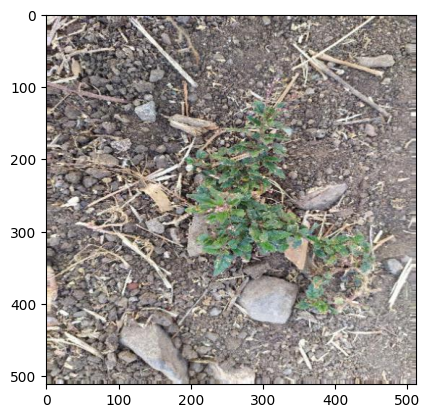

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = plt.imread('/kaggle/working/data/agri_0_1009.jpeg')
plt.imshow(img)

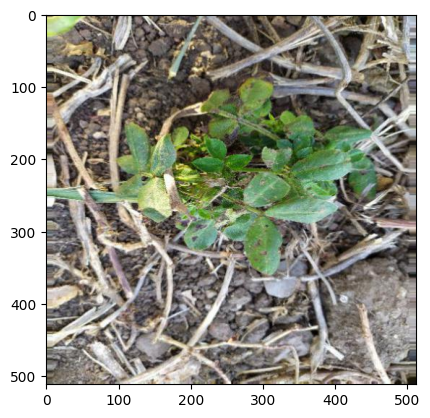

In [13]:
img2 = plt.imread('/kaggle/working/data/agri_0_6891.jpeg')
plt.imshow(img2)

* <h3 style='color:purple' >Afficher les Bibliothèques nécessaires </h3>

In [14]:
import os
import shutil
import math
import numpy as np
from ultralytics import YOLO

**Séparez l'image et le fichier texte dans le jeu de données. Dans le dossier contenant les images et les étiquettes, nous devons les séparer.**

In [15]:
def separate_files(srclocation,deslocation,type_ofImage):   
    if not os.path.exists("./"+deslocation):
        os.mkdir(deslocation)
    files = [t for t in os.listdir(srclocation) if type_ofImage in t.lower()]
    append_path=[]
    srclocation=srclocation+'/'
    for txt in files:
        temp = srclocation +(txt)
        append_path.append(temp)
    for image in append_path:
        newpath= deslocation+"/"
        shutil.move(image, newpath)

In [16]:
separate_files('/kaggle/working/data','images/','.jpeg')

In [17]:
separate_files('/kaggle/working/data','labels','.txt')

In [18]:
shutil.move('/kaggle/working/labels','/kaggle/working/data')
shutil.move('/kaggle/working/images','/kaggle/working/data')

'/kaggle/working/data/images'

* <h3 style='color:purple' >Diviser les dossiers </h3>

<div style="text-align: justify; font-weight:bold;">

Nous avons réparti les données pour l'entraînement, le test et la validation selon un ratio particulier. J'ai utilisé le package split-folders pour effectuer cette séparation selon le ratio spécifié.

Vous pouvez utiliser split-folders en tant que module Python ou en tant qu'interface en ligne de commande (CLI).

Si votre ensemble de données est équilibré (chaque classe a le même nombre d'échantillons), choisissez le ratio ; sinon, optez pour le mode fixe.
 </div>

In [19]:
!pip install split-folders

In [20]:
import splitfolders
splitfolders.ratio('/kaggle/working/data','output',seed=1337,ratio=(.7,.15,.15),group_prefix=None,move=False)

Copying files: 2600 files [00:00, 6400.85 files/s]


In [21]:
testImageCount = [f for f in os.listdir('/kaggle/working/output/test/images')]

In [22]:
len(testImageCount)

196

In [23]:
testLabelCount = [f for f in os.listdir('/kaggle/working/output/test/labels')]

In [24]:
len(testLabelCount)

196

In [25]:
model = YOLO("yolov8n.pt") #Load a pretrained model

100%|██████████| 6.23M/6.23M [00:00<00:00, 122MB/s]


* <h3 style='color:purple' >Détection d'objets avec un ensemble de données personnalisé </h3>

<div style="text-align: justify; font-weight:bold;">

Dans la détection d'objets avec un ensemble de données personnalisé, nous devons créer un fichier YAML. Si vous avez besoin de plus de détails sur le fichier YAML, les informations sont disponibles dans le fichier readme.md.
 </div>

In [26]:
custom={}

In [27]:
model.train(data='/kaggle/input/yaml-custom/custom.yaml', epochs=3)  # train the model

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/input/yaml-custom/custom.yaml, epochs=3, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=Non

100%|██████████| 755k/755k [00:00<00:00, 20.2MB/s]
2023-12-14 10:55:54,627	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2023-12-14 10:55:55,171	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/working/output/train/labels... 909 images, 0 backgrounds, 0 corrupt: 100%|██████████| 909/909 [00:00<00:00, 1134.77it/s]


train: New cache created: /kaggle/working/output/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/output/val/labels... 195 images, 0 backgrounds, 0 corrupt: 100%|██████████| 195/195 [00:00<00:00, 1318.53it/s]

val: New cache created: /kaggle/working/output/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      2.33G      1.406      2.412      1.707         39        640: 100%|██████████| 57/57 [00:13<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        195        316      0.684      0.526       0.54      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3      2.35G      1.326      1.815      1.635         43        640: 100%|██████████| 57/57 [00:10<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.16it/s]

                   all        195        316      0.405      0.547      0.423      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      2.35G      1.267      1.583      1.583         58        640: 100%|██████████| 57/57 [00:10<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.21it/s]

                   all        195        316      0.753      0.677      0.763      0.436



3 epochs completed in 0.013 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


                   all        195        316      0.752       0.68      0.763      0.436
                  crop        195        191      0.792      0.623      0.785      0.477
                  weed        195        125      0.712      0.736       0.74      0.396
Speed: 1.4ms preprocess, 1.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▁█▂
lr/pg1,▁█▂
lr/pg2,▁█▂
metrics/mAP50(B),▃▁█
metrics/mAP50-95(B),▃▁█
metrics/precision(B),▇▁█
metrics/recall(B),▁▂█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▄▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa8c072dcc0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [28]:
output_images = [t for t in os.listdir('/kaggle/working/runs/detect/train') if '.jpg' in t.lower()]

In [29]:
output_images

['val_batch2_labels.jpg',
 'labels.jpg',
 'train_batch0.jpg',
 'val_batch1_pred.jpg',
 'val_batch0_pred.jpg',
 'train_batch1.jpg',
 'labels_correlogram.jpg',
 'val_batch1_labels.jpg',
 'val_batch0_labels.jpg',
 'train_batch2.jpg',
 'val_batch2_pred.jpg']

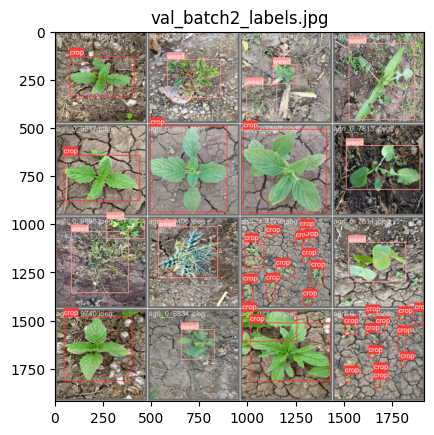

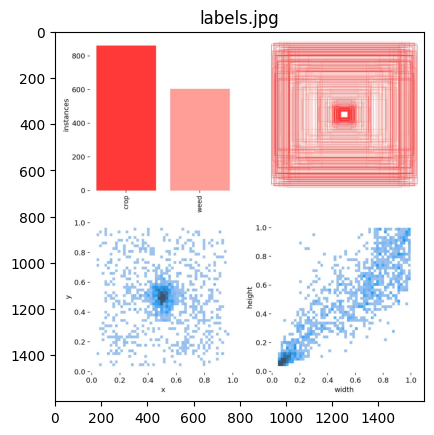

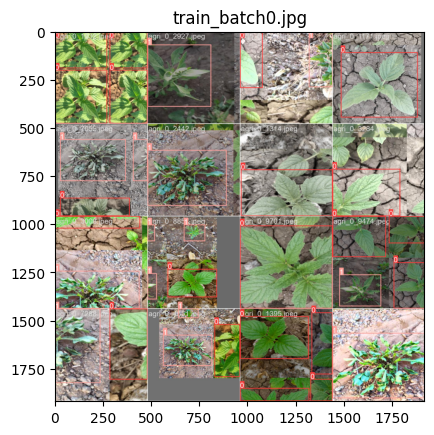

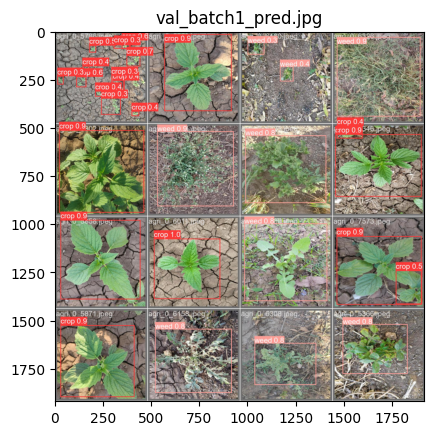

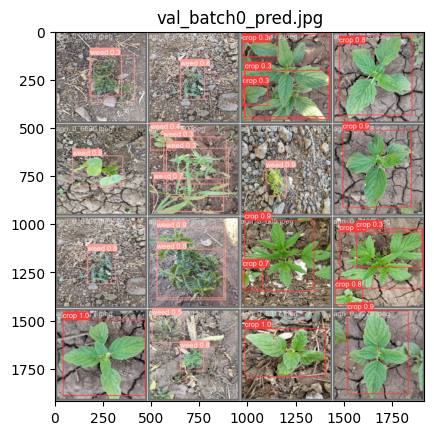

...

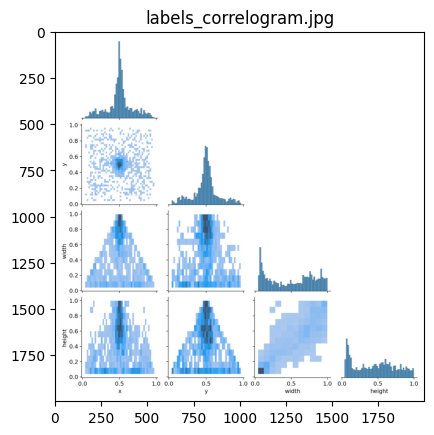

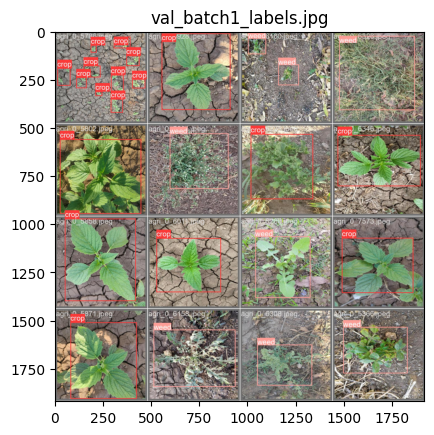

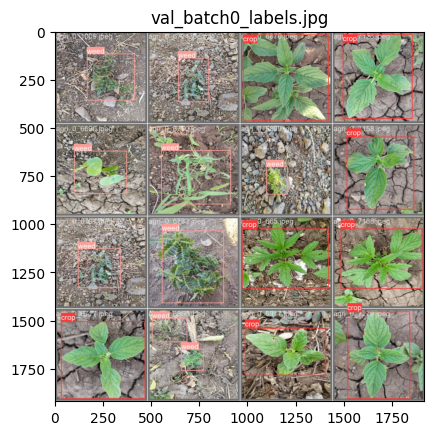

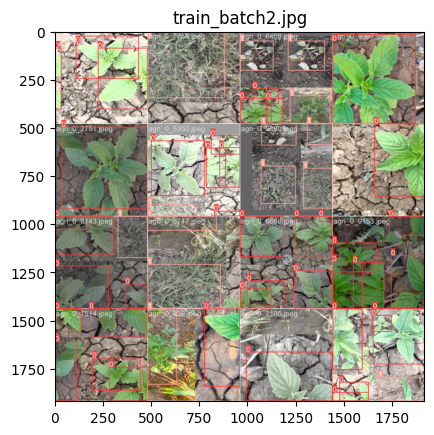

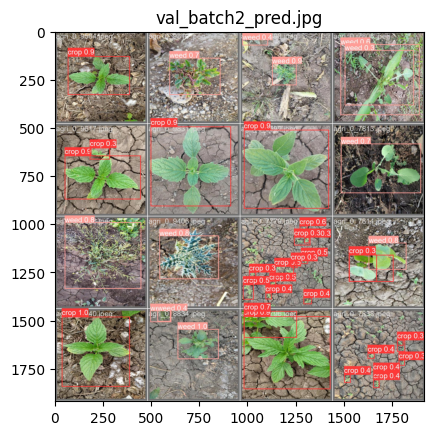

In [30]:
main_path = '/kaggle/working/runs/detect/train/'
for image in output_images:
    path=main_path +image
    tmp = plt.imread(path)
    plt.imshow(tmp)
    plt.title(image)
    plt.show()
  

**Plt the confusion matrix, F1 ,PR,P and R curve images**

In [31]:
matrix_images = [t for t in os.listdir('/kaggle/working/runs/detect/train') if '.png' in t.lower()]

In [32]:
matrix_images

['R_curve.png',
 'P_curve.png',
 'PR_curve.png',
 'confusion_matrix.png',
 'results.png',
 'F1_curve.png',
 'confusion_matrix_normalized.png']

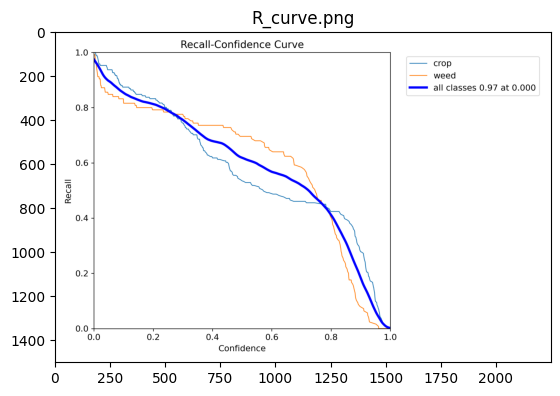

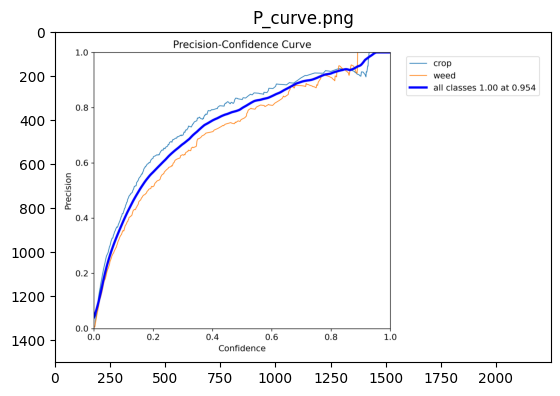

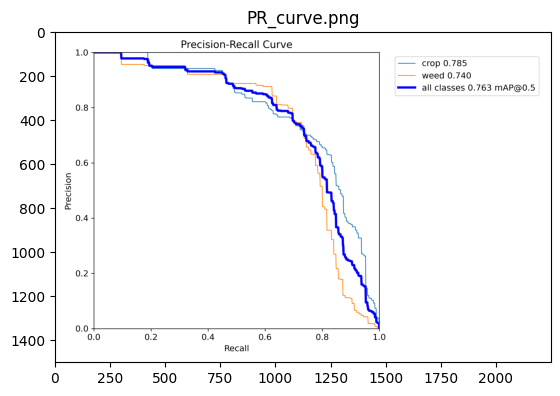

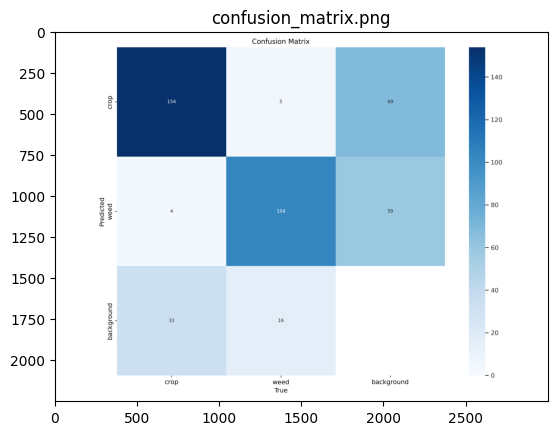

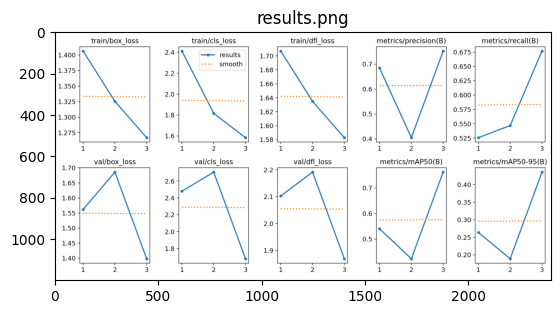

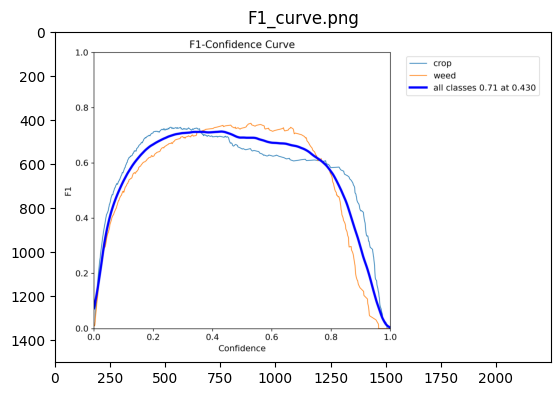

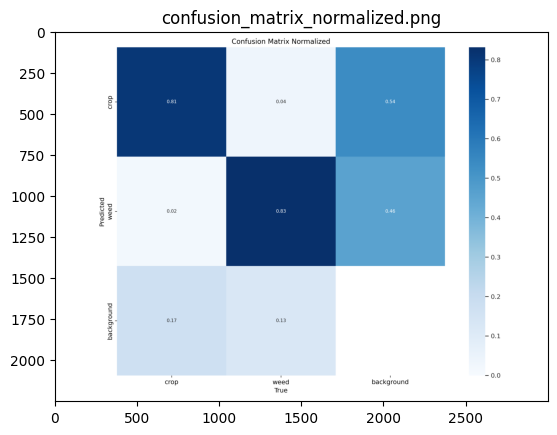

In [33]:
main_path = '/kaggle/working/runs/detect/train/'
for image in matrix_images:
    path=main_path +image
    tmp = plt.imread(path)
    plt.imshow(tmp)
    plt.title(image)
    plt.show()


* <h3 style='color:purple' >Utiliser notre model </h3>

<div style="text-align: justify; font-weight:bold;">

Une fois que le modèle est généré ou entraîné, notre modèle est enregistré dans le dossier runs/detect/train/weights (best.pt). Maintenant, nous pouvons déployer notre nouveau modèle. 
 </div>

In [34]:
model1  = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

In [35]:
model1.val() 

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/output/val/labels.cache... 195 images, 0 backgrounds, 0 corrupt: 100%|██████████| 195/195 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.16it/s]


                   all        195        316      0.752      0.677      0.763      0.437
                  crop        195        191      0.792      0.619      0.785      0.478
                  weed        195        125      0.713      0.736       0.74      0.396
Speed: 1.3ms preprocess, 3.9ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa8c0d96a40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [38]:
model1.predict(source='/kaggle/working/output/test/images',save=True)


image 1/196 /kaggle/working/output/test/images/agri_0_1026.jpeg: 640x640 1 crop, 6.0ms
image 2/196 /kaggle/working/output/test/images/agri_0_1146.jpeg: 640x640 3 weeds, 6.4ms
image 3/196 /kaggle/working/output/test/images/agri_0_1192.jpeg: 640x640 1 weed, 6.2ms
image 4/196 /kaggle/working/output/test/images/agri_0_1210.jpeg: 640x640 1 weed, 7.1ms
image 5/196 /kaggle/working/output/test/images/agri_0_1211.jpeg: 640x640 1 crop, 6.1ms
image 6/196 /kaggle/working/output/test/images/agri_0_1258.jpeg: 640x640 2 weeds, 5.9ms
image 7/196 /kaggle/working/output/test/images/agri_0_1332.jpeg: 640x640 4 crops, 5.9ms
image 8/196 /kaggle/working/output/test/images/agri_0_1334.jpeg: 640x640 1 weed, 5.8ms
image 9/196 /kaggle/working/output/test/images/agri_0_1420.jpeg: 640x640 2 weeds, 5.8ms
image 10/196 /kaggle/working/output/test/images/agri_0_1570.jpeg: 640x640 2 weeds, 5.7ms
image 11/196 /kaggle/working/output/test/images/agri_0_1612.jpeg: 640x640 1 weed, 5.9ms
image 12/196 /kaggle/working/output

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'crop', 1: 'weed'}
 orig_img: array([[[ 49,  65,  81],
         [ 56,  72,  88],
         [ 57,  73,  89],
         ...,
         [179, 207, 224],
         [179, 209, 226],
         [178, 208, 225]],
 
        [[ 98, 114, 130],
         [100, 116, 132],
         [ 98, 114, 130],
         ...,
         [146, 174, 191],
         [139, 169, 186],
         [134, 164, 181]],
 
        [[100, 116, 132],
         [101, 117, 133],
         [103, 119, 135],
         ...,
         [178, 205, 225],
         [182, 212, 231],
         [181, 211, 230]],
 
        ...,
 
        [[ 11,  11,  29],
         [  9,  11,  29],
         [  2,   5,  20],
         ...,
         [ 99, 112, 128],
         [ 98, 111, 127],
         [100, 113, 129]],
 
        [[ 23,  21,  40],
         [ 27,  27,  45],
         [ 26,  26,  42],
         ...,
         [  9,  22, 

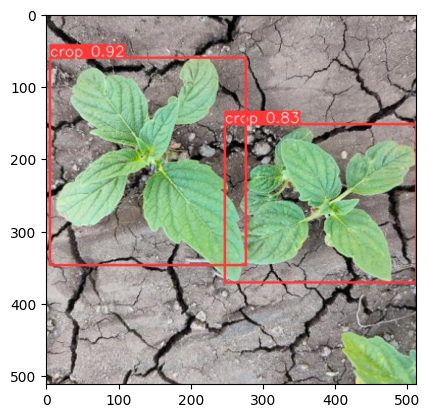

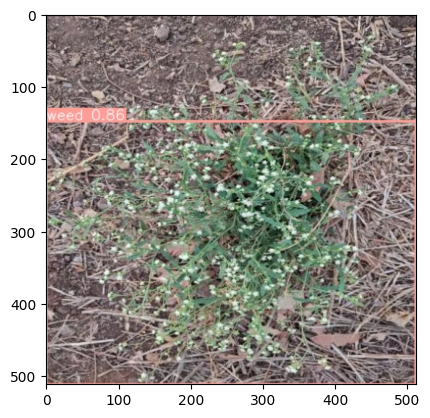

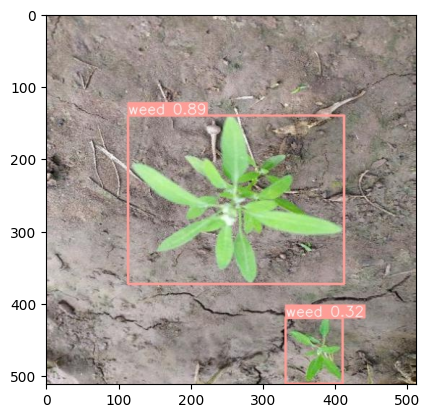

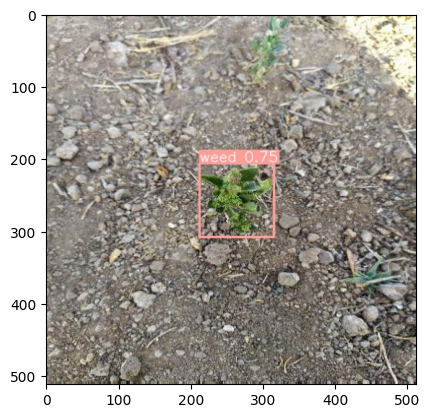

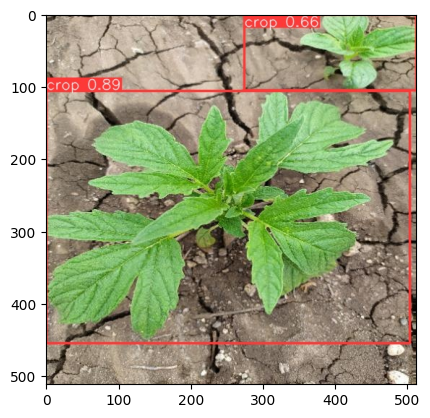

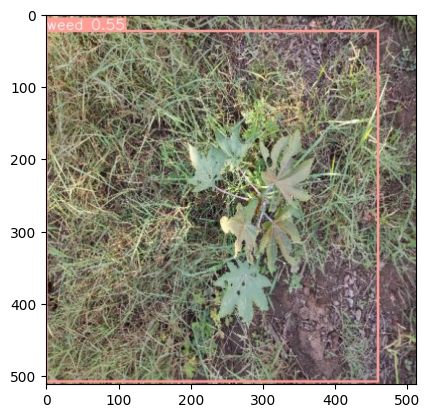

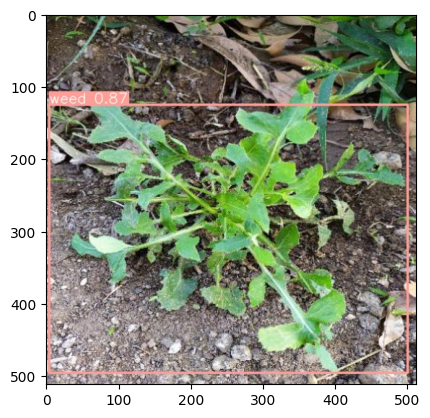

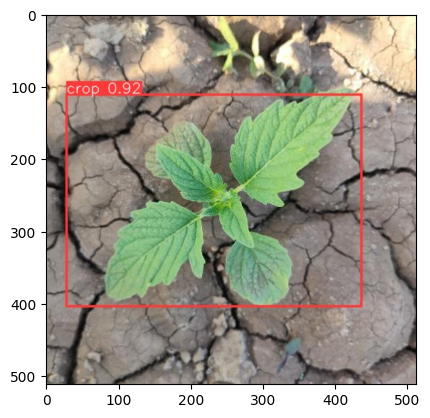

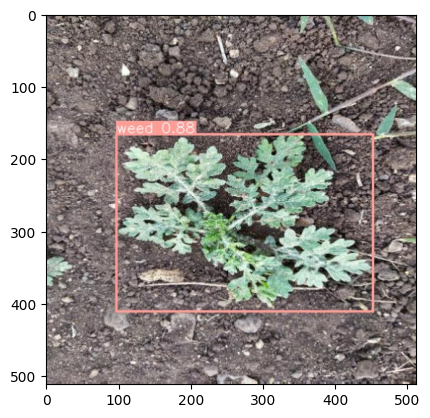

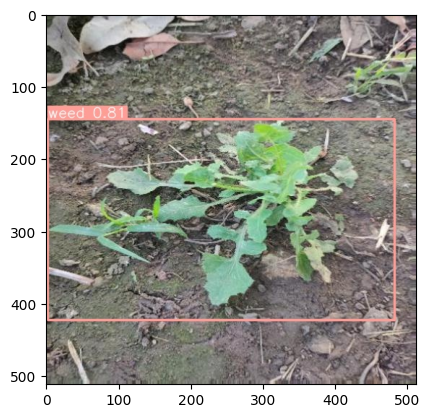

In [39]:
predicted_image = [t for t in os.listdir('/kaggle/working/runs/detect/predict') if '.jpeg' in t.lower()]
predict_path='/kaggle/working/runs/detect/predict/'
sample_image=predicted_image[10:20]
for image in sample_image:
    tmp=plt.imread(predict_path+image)
    plt.imshow(tmp)
    plt.grid(False)
    plt.show()

<h2 style='color:orangered' align='center'>Références</h2>

---
<div style="background-color:#be97c5; color:black; font-size:15px; font-family:Verdana; padding:10px;font-weight:bold;border: 5px solid black;text-align:center">
<ul>
<li><a href="https://docs.ultralytics.com/" style="color:black;"> https://docs.ultralytics.com/ </a></li>
<li><a href="https://www.youtube.com/watch?v=ag3DLKsl2vk" style="color:black;"> https://www.youtube.com/watch?v=ag3DLKsl2vk </a></li>
<li><a href="https://medium.com/@connect.vin/yat-an-open-source-data-annotation-tool-for-yolo-8bb75bce1767" style="color:black;"> https://medium.com/@connect.vin/yat-an-open-source-data-annotation-tool-for-yolo-8bb75bce1767 </a></li>
<li><a href="https://pjreddie.com/darknet/yolo/" style="color:black;"> https://pjreddie.com/darknet/yolo/ </a></li>
    
</ul>
</div>

---

<h2 style='color:#4c4893' align='center'>Fin</h2>